# UMAP MODEL 

In [1]:
import numpy as np 
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px

from sklearn import metrics
import math

sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [2]:
import umap


## DATA LOADING


This notebook goal is building a model based on UMAP dimensionallity reduction to predict the Remaining Useful Life of a certain instance.

On this purpose, first a UMAP projection is going to be built.

Once we have the projection, we apply it over the new point that we would like to predict. This point, in case that the projection results are good enough, will be near to other instances in a similar health situation.

The last step is selecting a number of "nearest neighbours", based on the two new axes, and predicting as the final outcome the remaining useful life of those. 

In [3]:
train_df = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/train_FD002.txt", delimiter = ' ')
test_df  = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/test_FD002.txt", delimiter = ' ')
RUL_test = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/RUL_FD002.txt")


In [4]:
#Unuseful columns deleting 

train_df.drop(['T_EGT', 'SmFan', 'SmLPC', 'SmHPC'], axis = 1, inplace = True)

test_df.drop(['T_EGT', 'SmFan', 'SmLPC', 'SmHPC'], axis = 1, inplace = True)


###TRAIN DATA SET###

# Standarization for both sensor variables and operational conditions

# Data labeling - Remaining Useful LIfe (RUL) --> Time to failure

RUL = pd.DataFrame(train_df.groupby('Unit')['Cycle'].max()).reset_index()
RUL.columns = ['Unit','UL']
train_df = train_df.merge(RUL, on = ['Unit'], how = 'left')
train_df['RUL'] = train_df['UL'] - train_df['Cycle']


# Data labeling - UL_30 - UL_50 - UL_75 --> Labeling to predict if the turbine is going to fail on les than 30, 50 or 75 cycles

train_df['UL_30'] = np.where(train_df['RUL'] <= 30, 1, 0)
train_df['UL_50'] = np.where(train_df['RUL'] <= 50, 1, 0)
train_df['UL_75'] = np.where(train_df['RUL'] <= 75, 1, 0)


In [5]:
###TEST DATA SET###

# We use the ground truth dataset to generate labels for the test data.
# generate column max for test data
rul = pd.DataFrame(test_df.groupby('Unit')['Cycle'].max()).reset_index()
rul.columns = ['Unit', 'max']
RUL_test.columns = ['more']
RUL_test['Unit'] = RUL_test.index + 1
RUL_test['max'] = rul['max'] + RUL_test['more']
RUL_test.drop('more', axis=1, inplace=True)

# generate RUL for test data
test_df = test_df.merge(RUL_test, on=['Unit'], how='left')
test_df['RUL'] = test_df['max'] - test_df['Cycle']
#test_df.drop('max', axis=1, inplace=True)

#Data labeling - UL_30 - UL_50 - UL_75 --> Labeling to predict if the turbine is going to fail on les than 30, 50 or 75 cycles

test_df['UL_30'] = np.where(test_df['RUL'] <= 30, 1, 0)
test_df['UL_50'] = np.where(test_df['RUL'] <= 50, 1, 0)
test_df['UL_75'] = np.where(test_df['RUL'] <= 75, 1, 0)


### DATA VECTOR PREPARATION

On this stage, I am going to prepare the data vectors that we are using as input for the UMAP projection.


In [6]:
train_df.head()

,Unit,Cycle,OP1,OP2,OP3,T2,T24,T30,T50,P2,...,htBleed,Nf_dmd,PCNfR_dmd,W31,W32,UL,RUL,UL_30,UL_50,UL_75
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,334,2223,100.00,14.73,8.8071,149,148,0,0,0
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,330,2212,100.00,10.41,6.2665,149,147,0,0,0
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,309,1915,84.93,14.08,8.6723,149,146,0,0,0
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,329,2212,100.00,10.59,6.4701,149,145,0,0,0
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,309,1915,84.93,14.13,8.5286,149,144,0,0,0


In [7]:
train_cols = train_df.columns.difference(['Unit','Cycle','UL','RUL','UL_30','UL_50', 'UL_75'])
train_vector = train_df[train_cols]

train_vector.head()

,BPR,NRc,NRf,Nc,Nf,Nf_dmd,OP1,OP2,OP3,P15,...,T2,T24,T30,T50,W31,W32,epr,farB,htBleed,phi
0,9.3461,8048.56,2387.72,8341.91,2222.65,2223,34.9983,0.8400,100.0,8.00,...,449.44,555.32,1358.61,1137.23,14.73,8.8071,1.02,0.02,334,183.06
1,9.3774,8072.30,2387.66,8303.96,2211.57,2212,41.9982,0.8408,100.0,5.71,...,445.00,549.90,1353.22,1125.78,10.41,6.2665,1.02,0.02,330,130.42
2,10.8941,7864.87,2028.03,8001.42,1915.11,1915,24.9988,0.6218,60.0,9.02,...,462.54,537.31,1256.76,1047.45,14.08,8.6723,0.94,0.02,309,164.22
3,9.3528,8068.66,2387.61,8303.96,2211.58,2212,42.0077,0.8416,100.0,5.71,...,445.00,549.51,1354.03,1126.38,10.59,6.4701,1.02,0.02,329,130.72
4,10.8963,7861.23,2028.00,7993.23,1915.10,1915,25.0005,0.6203,60.0,9.03,...,462.54,537.07,1257.71,1047.93,14.13,8.5286,0.94,0.02,309,164.31


In [8]:
test_vector = test_df[train_cols]

test_vector.head()

,BPR,NRc,NRf,Nc,Nf,Nf_dmd,OP1,OP2,OP3,P15,...,T2,T24,T30,T50,W31,W32,epr,farB,htBleed,phi
0,8.6476,8114.10,2388.18,8763.80,2318.96,2319,9.9987,0.2502,100.0,15.49,...,489.05,605.03,1497.17,1304.99,28.42,17.1551,1.26,0.03,369,371.69
1,9.2405,8053.06,2388.12,8713.21,2323.95,2324,20.0026,0.7000,100.0,13.66,...,491.19,607.82,1481.20,1246.11,24.29,14.8039,1.08,0.02,364,315.32
2,9.3472,8053.04,2387.75,8340.20,2222.67,2223,35.0045,0.8400,100.0,8.00,...,449.44,556.00,1359.08,1128.36,14.98,8.9125,1.02,0.02,333,183.04
3,9.3961,8066.90,2387.72,8313.85,2211.58,2212,42.0066,0.8410,100.0,5.71,...,445.00,550.17,1349.69,1127.89,10.35,6.4181,1.02,0.02,332,130.40
4,10.8682,7865.66,2028.05,7997.13,1915.10,1915,24.9985,0.6213,60.0,9.03,...,462.54,536.72,1253.18,1050.69,14.31,8.5740,0.94,0.02,305,164.56


In [9]:
test_lastcycle = pd.DataFrame([test_df[test_df['Unit']==id].iloc[-1,:]
    for id in test_df['Unit'].unique()]).reset_index(drop = True)

In [10]:
RUL_test = test_lastcycle['RUL']


In [ ]:
test_df[test_df['Unit']==1].tail()

## UMAP MODEL FITTING

In [11]:
train_v = (train_vector.to_numpy())
test_v = (test_lastcycle[train_cols].to_numpy())

In [12]:
print(train_v.shape, test_v.shape)

(53759, 24) (259, 24)


In [13]:
trans = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.25, metric='chebyshev').fit(train_v) # Projection calculation
train_emb = trans.embedding_ # Projection over the euclidean space
test_emb = trans.transform(test_v) # Projection test data set over the euclidean space

In [ ]:
train_df.head()

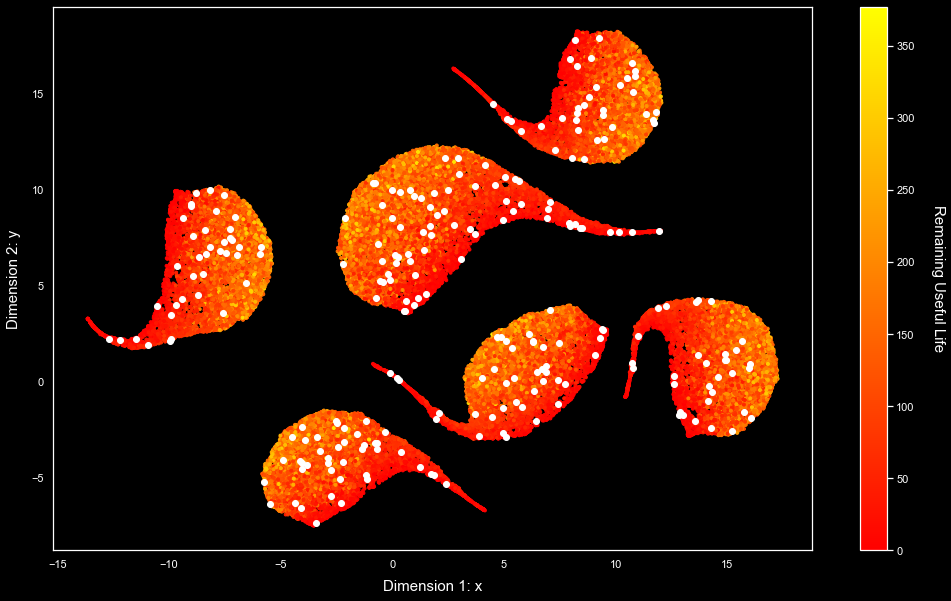

In [14]:
plt.style.use('dark_background')

fig = plt.figure(figsize = (17,10) )

ax = fig.add_subplot(111)

plot = ax.scatter(train_emb[:,0], train_emb[:,1], c = train_df['RUL'], cmap= 'autumn', marker = '.', label = 'Useful Lifetime')

cbar = plt.colorbar(plot)

cbar.ax.set_ylabel('Remaining Useful Life', rotation = 270, size = 15, labelpad = +30)

plot = ax.scatter(test_emb[:,0], test_emb[:,1],  color = 'white', marker = 'o')

ax.set_xlabel("Dimension 1: x", size = 15, labelpad = 10)
ax.set_ylabel("Dimension 2: y", size = 15, labelpad = 10)
ax.tick_params(colors = 'white')


fig.show()

In [ ]:
plt.style.use('dark_background')

fig = plt.figure(figsize = (17,10) )

ax = fig.add_subplot(111)
plot = ax.scatter(train_emb[:,0], train_emb[:,1], c = train2['UL'], cmap= 'autumn', marker = '.', label = 'Useful Lifetime')

ax.set_xlabel("Dimension 1: x", size = 15, labelpad = 10)
ax.set_ylabel("Dimension 2: y", size = 15, labelpad = 10)
ax.tick_params(colors = 'white')


cbar = plt.colorbar(plot)

cbar.ax.set_ylabel('Remaining Useful Life', rotation = 270, size = 15, labelpad = +30)




fig.show()

In [ ]:
plt.style.use('dark_background')

plt.scatter(train_emb[:,0], train_emb[:,1], c = train2['RUL_index'], cmap= 'autumn', marker = '.', label = 'Remaining Useful Index')

plt.colorbar()
plt.xticks()
plt.yticks()
plt.legend()

In [ ]:
train_df.head()

In [15]:
RUL_train = train_df['RUL'].to_numpy()

RUL_train[RUL_train > 150] = 150

print(RUL_train.shape)

(53759,)


In [16]:
NN = 20

distances = metrics.pairwise_distances(test_emb,train_emb)

RUL_predict = np.zeros(len(test_emb))
RUL_index_predict = np.zeros(len(test_emb))

for i in range(len(test_emb)):

    print('Unidad:', i)

    maxs = np.zeros(NN)

    dist = np.zeros((len(train_emb),2))
    dist[:,0] = range(len(train_emb))
    dist[:,1] = distances[i,:]

    #display(dist)
    #print(dist.shape)

    #display(np.sort(dist[:,1]))

    for j in range(NN):

        #print(np.argmin(dist[:,1]))
        #print(dist[np.argmin(dist[:,1]),1])
        

        maxs[j] = dist[np.argmin(dist[:,1]),0]

        dist = np.delete(dist, obj = np.argmin(dist[:,1]), axis = 0)
    
    RUL_predict[i] = round(np.mean(RUL_train[[maxs.astype(int)]]))

    #print("Maxs: ", maxs)
    #print(RUL_train[maxs.astype(int)])

Unidad: 0
Unidad: 1
Unidad: 2
Unidad: 3
Unidad: 4
Unidad: 5
Unidad: 6
Unidad: 7
Unidad: 8
Unidad: 9
Unidad: 10
Unidad: 11
Unidad: 12
Unidad: 13
Unidad: 14
Unidad: 15
Unidad: 16
Unidad: 17
Unidad: 18
Unidad: 19
Unidad: 20
Unidad: 21
Unidad: 22
Unidad: 23
Unidad: 24
Unidad: 25
Unidad: 26
Unidad: 27
Unidad: 28
Unidad: 29
Unidad: 30
Unidad: 31
Unidad: 32
Unidad: 33
Unidad: 34
Unidad: 35
Unidad: 36
Unidad: 37
Unidad: 38
Unidad: 39
Unidad: 40
Unidad: 41
Unidad: 42
Unidad: 43
Unidad: 44
Unidad: 45
Unidad: 46
Unidad: 47
Unidad: 48
Unidad: 49
Unidad: 50
Unidad: 51
Unidad: 52
Unidad: 53
Unidad: 54
Unidad: 55
Unidad: 56
Unidad: 57
Unidad: 58
Unidad: 59
Unidad: 60
Unidad: 61
Unidad: 62
Unidad: 63
Unidad: 64
Unidad: 65
Unidad: 66
Unidad: 67
Unidad: 68
Unidad: 69
Unidad: 70
Unidad: 71
Unidad: 72
Unidad: 73
Unidad: 74
Unidad: 75
Unidad: 76
Unidad: 77
Unidad: 78
Unidad: 79
Unidad: 80
Unidad: 81
Unidad: 82
Unidad: 83
Unidad: 84
Unidad: 85
Unidad: 86
Unidad: 87
Unidad: 88
Unidad: 89
Unidad: 90
Unidad: 9

In [17]:
print(RUL_predict)

[ 16.  76.  76.  65.  12. 140.   8. 110.  16. 114.  12. 105. 105.   6.
  96.  99. 108. 129.  14.  70.  87.  12. 103.  53.  92. 110. 130. 104.
 112.  76. 121.  25.  88. 143. 102. 108.  91.  91.  86.  43.  55.  62.
  39.  11.  14. 123.  96.  26. 118.  16. 113.  50.  28. 130.  89. 135.
 144.  16. 118. 120.  87.  33.  80.   9.  21. 118.  90.  34. 122.  26.
 140. 110.  82. 116.  88.  30. 112.  40. 127.  20. 125. 114. 144.  62.
  53. 133.  32. 109. 131.  20.   8. 124. 103. 118.  78.  61.  38. 137.
  46.  12. 119.  11.  10. 118. 128. 113. 109. 109.  51.  84.   9.  95.
 123.  72.  69.  46.  91. 119. 124.  20.  91.  92. 111.  17. 107. 119.
  72. 121.  60. 123. 139.  92.  50.   2. 138.  43.  41.  13.  77.  51.
 118.  11.  80.  61. 120.  15. 107.  13. 125.  85.  78. 119.  97.  93.
 136. 118.  94.  18.   8.  80.  14.  42.  69.   8. 128.  92. 120. 113.
  80. 121.  26. 114.   8.  90. 135.  30.  13. 121.  83. 120.  45.  15.
  74. 117.  10.   6. 110. 102.  39.  26. 132.  19. 112. 129.  46. 148.
 134. 

In [18]:
print(RUL_predict.shape, RUL_test.to_numpy().shape)

(259,) (259,)


In [19]:
error = RUL_predict - RUL_test
abs_error = np.absolute(error)
mean_error = np.mean(abs_error)


print("Mean RUL error: " , mean_error )



Mean RUL error:  24.057915057915057


The model score is: 54229.65849360635
The model accuracy is: 38.61003861003861
The model MAE is: 24.057915057915057
The model MSE is : 1038.034749034749
The model Mean Absolute Percentage Error (MAPE) is: 34.79756806529958
The model Mean Absolute Percentage Error 2 (MAPE_2) is: 11.611428325515956


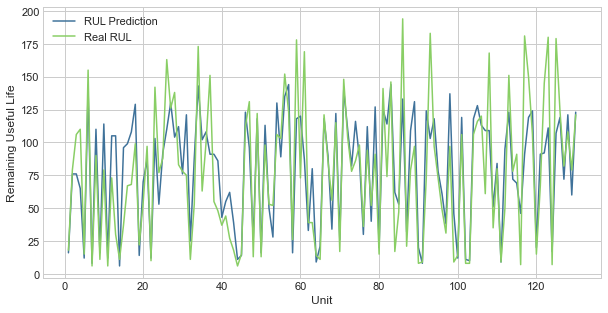

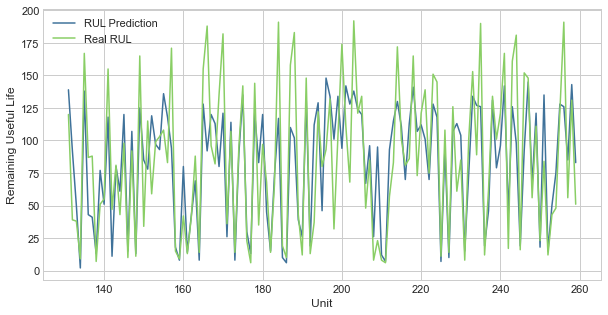

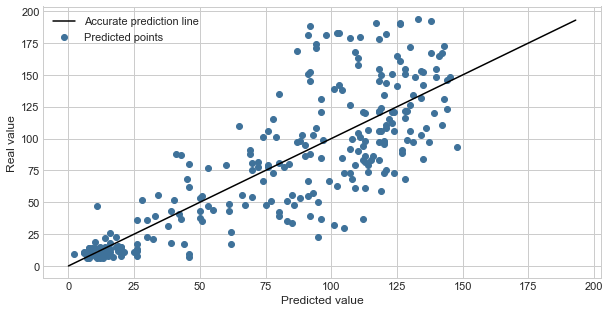

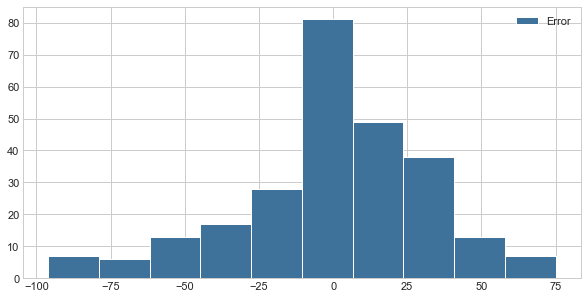

In [20]:
plt.style.use('seaborn-whitegrid')
from Perform_function import perform_func 
y_pred_test = RUL_predict
y_true_test = RUL_test

_, _, _, _, _, _ = perform_func(y_pred_test, y_true_test, test_df.groupby('Unit').max()['Cycle'].to_numpy())

In [ ]:
test_lastcycle['RUL_predict'] = RUL_predict
test_lastcycle['RUL_test'] = RUL_test.to_numpy()[:,0]
test_lastcycle['error'] = error
test_lastcycle['Absolute_error'] = abs_error
test_lastcycle['Embedding_x'] = test_emb[:,0]
test_lastcycle['Embedding_y'] = test_emb[:,1]



In [ ]:
print(test_lastcycle[test_lastcycle['Absolute_error'] > 30])
print(len(test_lastcycle[test_lastcycle['Absolute_error'] > 30]))


In [ ]:
print(error)

error.shape

In [ ]:
RUL_test

In [ ]:
plt.style.use('seaborn-whitegrid')

plt.figure(figsize = (10,5))
plt.plot(range(len(test_emb)), RUL_predict, color = "#3f729a", label = 'Prediction')
plt.plot(range(len(test_emb)), RUL_test, color = "#89ce65", label = 'Real')
#plt.plot(range(len(test_emb[:130])), abs_error[:130], color = 'red', label = 'Error')

plt.ylabel('Remaining Useful Life')
plt.xlabel('Unit')

plt.xticks(range(0,100,10))

plt.legend()

In [ ]:
plt.figure(figsize = (30,5))
plt.plot(range(130, len(test_emb)), RUL_predict[130:], color = 'white', label = 'Prediction')
plt.plot(range(130, len(test_emb)), RUL_test[130:], color = 'green', label = 'Real')
plt.plot(range(130, len(test_emb)), abs_error[130:], color = 'red', label = 'Error')

plt.ylabel('Remaining Useful Life', size = 15)
plt.xlabel('Unit', size = 15)

plt.xticks(range(130,260,10))

plt.legend(fontsize = 'large')


In [ ]:
distances = metrics.pairwise_distances(test_emb,train_emb)

display(distances)

print(distances.shape)

In [ ]:
print(math.sqrt((test_emb[0,0]-train_emb[1,0])**2 + (test_emb[0,1]-train_emb[1,1])**2 ))

In [ ]:
plt.style.use('dark_background')

plt.scatter(train_emb[:,0], train_emb[:,1], c = train2['RUL_index'], cmap= 'autumn', marker = '.', label = 'Train')

plt.colorbar()
plt.scatter(test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Embedding_x'], test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Embedding_y'], c = test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Absolute_error'] , cmap = 'cool', marker= 'o')
plt.colorbar()

In [ ]:
fig = plt.figure(figsize = (10,5))

ax = fig.add_subplot(111)

ax.scatter(RUL_predict, RUL_test, c = "#3f729a", marker = 'o')
ax.plot(range(200), range(200), c = 'black')

ax.set_ylabel('Real value')
ax.set_xlabel('Predicted value')

In [ ]:
from Perform_function import perform_func 
_, _, _, _, _, _ = perform_func(RUL_predict, RUL_test[:,0], test2.groupby('Unit').max()['Cycle'].to_numpy())

In [ ]:
test2.head()

In [ ]:
print(RUL_predict.shape, RUL_test.shape)

#### SCORE METRIC

In [ ]:
s = np.zeros(len(RUL_predict))

a_1 = 10
a_2 = 13

for i in range(len(error)):

    if error[i] < 0 : 

        s[i] = math.exp(-error[i]/a_1) - 1 
    else : 
        s[i] = math.exp(error[i]/a_2) - 1

performance_evaluation = np.sum(s)

print('The model performance evaluation is:', performance_evaluation)



In [25]:
NN = 20

distances = metrics.pairwise_distances(train_emb,train_emb)

RUL_train_predict = np.zeros(len(train_emb))
RUL_index_train_predict = np.zeros(len(train_emb))

for i in range(len(train_emb)):

    print('Unidad:', i)

    maxs = np.zeros(NN)

    dist = np.zeros((len(train_emb),2))
    dist[:,0] = range(len(train_emb))
    dist[:,1] = distances[i,:]

    #display(dist)
    #print(dist.shape)

    #display(np.sort(dist[:,1]))

    for j in range(NN):

        #print(np.argmin(dist[:,1]))
        #print(dist[np.argmin(dist[:,1]),1])
        

        maxs[j] = dist[np.argmin(dist[:,1]),0]

        dist = np.delete(dist, obj = np.argmin(dist[:,1]), axis = 0)
    
    RUL_train_predict[i] = round(np.mean(RUL_train[[maxs.astype(int)]]))

    #print("Maxs: ", maxs)
    #print(RUL_train[maxs.astype(int)])

Unidad: 52330
Unidad: 52331
Unidad: 52332
Unidad: 52333
Unidad: 52334
Unidad: 52335
Unidad: 52336
Unidad: 52337
Unidad: 52338
Unidad: 52339
Unidad: 52340
Unidad: 52341
Unidad: 52342
Unidad: 52343
Unidad: 52344
Unidad: 52345
Unidad: 52346
Unidad: 52347
Unidad: 52348
Unidad: 52349
Unidad: 52350
Unidad: 52351
Unidad: 52352
Unidad: 52353
Unidad: 52354
Unidad: 52355
Unidad: 52356
Unidad: 52357
Unidad: 52358
Unidad: 52359
Unidad: 52360
Unidad: 52361
Unidad: 52362
Unidad: 52363
Unidad: 52364
Unidad: 52365
Unidad: 52366
Unidad: 52367
Unidad: 52368
Unidad: 52369
Unidad: 52370
Unidad: 52371
Unidad: 52372
Unidad: 52373
Unidad: 52374
Unidad: 52375
Unidad: 52376
Unidad: 52377
Unidad: 52378
Unidad: 52379
Unidad: 52380
Unidad: 52381
Unidad: 52382
Unidad: 52383
Unidad: 52384
Unidad: 52385
Unidad: 52386
Unidad: 52387
Unidad:52388
Unidad: 52389
Unidad: 52390
Unidad: 52391
Unidad: 52392
Unidad: 52393
Unidad: 52394
Unidad: 52395
Unidad: 52396
Unidad: 52397
Unidad: 52398
Unidad: 52399
Unidad: 52400
Unidad:

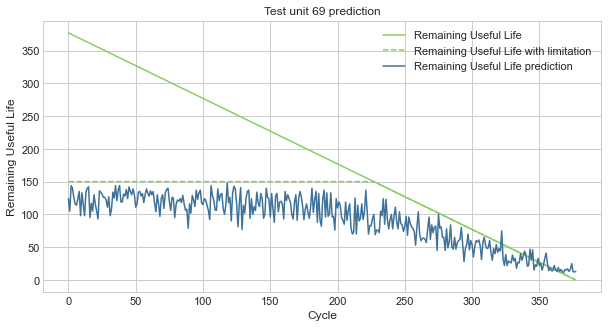

In [27]:
train_df['RUL_predict'] = RUL_train_predict
train_df['RUL_tuned'] = RUL_train

unit = 118

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize = (10,5))

ax = fig.add_subplot(111)

ax.plot(range(len(train_df[train_df['Unit']==unit])), train_df[train_df['Unit']==unit]['RUL'], color = "#89ce65", label = "Remaining Useful Life")
ax.plot(range(len(train_df[train_df['Unit']==unit])), train_df[train_df['Unit']==unit]['RUL_tuned'], color ="#89ce65", label = "Remaining Useful Life with limitation", linestyle = '--')
ax.plot(range(len(train_df[train_df['Unit']==unit])), train_df[train_df['Unit']==unit]['RUL_predict'], color ="#3f729a", label = "Remaining Useful Life prediction")


ax.set_ylabel("Remaining Useful Life")
ax.set_xlabel("Cycle")
ax.set_title("Test unit 118 prediction")

ax.legend()


In [ ]:
train_df['RUL'] = 

In [ ]:
test_lastcycle[test_lastcycle['Absolute_error'] < 10 ]['RUL_test'].mean()

In [ ]:
def Computed_Score(y_true, y_pred):
    ##Computed score used in the challenge

    a1 = 10
    a2 = 13
    score = 0
    d = y_pred - y_true

    for i in d: 
        if i<0:
            score += (e**(-i/a1) - 1)
        else : 
            score += (e**(i/a2) - 1)
    
    return score


In [ ]:
from math import e
Computed_Score(RUL_test.to_numpy()[:,0],RUL_predict)

In [ ]:
print(RUL_test.shape,RUL_predict.shape)

In [ ]:
RUL_test.to_numpy()[:,0]

In [21]:
error_df = pd.DataFrame()
error_df[['Unit','Cycle','RUL']] = test_lastcycle[['Unit','Cycle','RUL']]
error_df['error'] =  np.abs(y_pred_test - y_true_test)

error_df['Group'] = 0
error_df.loc[error_df['Cycle'] <= 20, 'Group'] = 1
error_df.loc[(error_df['Cycle'] <= 40) & (error_df['Cycle'] > 20) , 'Group'] = 2
error_df.loc[(error_df['Cycle'] <= 60) & (error_df['Cycle'] > 40) , 'Group'] = 3
error_df.loc[(error_df['Cycle'] <= 80) & (error_df['Cycle'] > 60) , 'Group'] = 4
error_df.loc[(error_df['Cycle'] <= 100) & (error_df['Cycle'] > 80) , 'Group'] = 5
error_df.loc[(error_df['Cycle'] <= 120) & (error_df['Cycle'] > 100) , 'Group'] = 6
error_df.loc[(error_df['Cycle'] <= 140) & (error_df['Cycle'] > 120) , 'Group'] = 7
error_df.loc[(error_df['Cycle'] > 140) , 'Group'] = 8

error_df['Group_RUL'] = 0
error_df.loc[error_df['RUL'] <= 20, 'Group_RUL'] = 1
error_df.loc[(error_df['RUL'] <= 40) & (error_df['RUL'] > 20) , 'Group_RUL'] = 2
error_df.loc[(error_df['RUL'] <= 60) & (error_df['RUL'] > 40) , 'Group_RUL'] = 3
error_df.loc[(error_df['RUL'] <= 80) & (error_df['RUL'] > 60) , 'Group_RUL'] = 4
error_df.loc[(error_df['RUL'] <= 100) & (error_df['RUL'] > 80) , 'Group_RUL'] = 5
error_df.loc[(error_df['RUL'] <= 120) & (error_df['RUL'] > 100) , 'Group_RUL'] = 6
error_df.loc[(error_df['RUL'] <= 140) & (error_df['RUL'] > 120) , 'Group_RUL'] = 7
error_df.loc[(error_df['RUL'] <= 160) & (error_df['RUL'] > 140) , 'Group_RUL'] = 8
error_df.loc[(error_df['RUL'] <= 180) & (error_df['RUL'] > 160) , 'Group_RUL'] = 9
error_df.loc[(error_df['RUL'] > 180) , 'Group_RUL'] = 10

In [22]:
error_grouped  = error_df.groupby('Group').mean()

error_grouped_RUL = error_df.groupby('Group_RUL').mean()

error_grouped

,Unit,Cycle,RUL,error,Group_RUL
Group,,,,,
2,146.600000,31.933333,136.733333,26.000000,7.266667
3,163.666667,51.791667,133.708333,31.500000,7.291667
4,111.352941,71.764706,127.882353,32.794118,6.911765
5,140.894737,90.157895,130.684211,35.894737,7.052632
6,144.631579,110.789474,92.210526,35.210526,5.157895
7,121.807692,128.884615,54.230769,25.500000,3.269231
8,124.303279,185.737705,47.327869,16.032787,2.803279


In [23]:
error_grouped_RUL

error_df[error_df['Group_RUL']==0]

,Unit,Cycle,RUL,error,Group,Group_RUL


In [ ]:
fig = plt.figure(figsize = (10,5))

ax = fig.add_axes([0,0,1,1])
ratios = ['0-20','20-40', '40-60', '60-80', '80-100', '100-120','120-140','140-160','160-180', '>180']
errors = error_grouped['error']
ax.bar(ratios,errors,color="#3f729a")
plt.ylabel("Mean Absolute Error")
plt.xlabel("Cycle ranges")
plt.ylim(0,50)
plt.show()


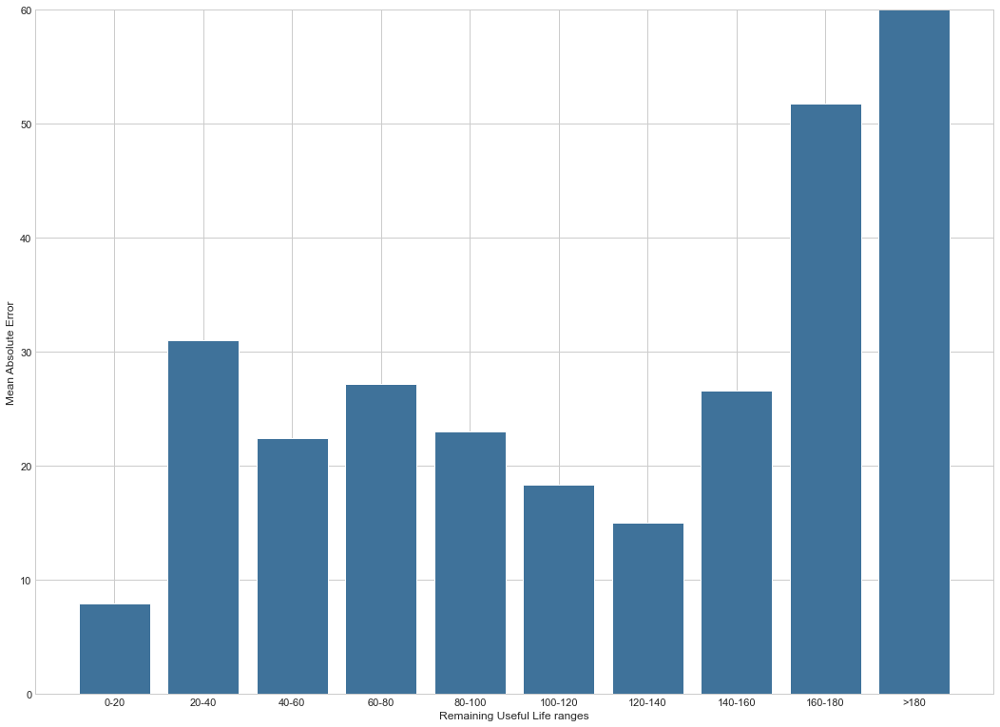

In [24]:
fig = plt.figure()

ax = fig.add_axes([0,0,1,1])
ratios = ['0-20','20-40', '40-60', '60-80', '80-100', '100-120','120-140','140-160','160-180', '>180']
errors = error_grouped_RUL['error']
ax.bar(ratios,errors,color="#3f729a")
plt.ylabel("Mean Absolute Error")
plt.xlabel("Remaining Useful Life ranges")
plt.ylim(0,60)
plt.show()

In [ ]:
pd.DataFrame(y_pred_test, columns = ['RUL']).to_csv('UMAP_FD1_prediction.csv')

In [ ]:
plt.hist(test_lastcycle['RUL'])
plt.show()